### Banksy Analysis

In [5]:
import os, re
import numpy as np
import pandas as pd
from IPython.display import display
import warnings

warnings.filterwarnings("ignore")

import scipy.sparse as sparse
from scipy.io import mmread
from scipy.stats import pearsonr, pointbiserialr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D

import seaborn as sns
import scanpy as sc

sc.logging.print_header()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 1  # errors (0), warnings (1), info (2), hints (3)
plt.rcParams["font.family"] = "Arial"
sns.set_style("white")

import random

# Note that BANKSY itself is deterministic, here the seeds affect the umap clusters and leiden partition
seed = 1234
np.random.seed(seed)
random.seed(seed)

scanpy==1.9.5 anndata==0.10.2 umap==0.5.4 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.10.6 pynndescent==0.5.10


In [ ]:
import os

import pandas as pd
import scanpy as sc
from spatialdata_io import xenium


def load_xenium_data(folder: str):
    """
    Load and preprocess 10X Xenium data from the specified folder and return a processed AnnData object.

    Parameters
    ----------
    folder : str
        Path to the folder containing Xenium data.

    Returns
    -------
    anndata.AnnData
        AnnData object containing the preprocessed expression matrix and associated metadata.
    """
    # 1. Load Xenium data from the folder; retrieve only the cells table (cells_table=True)
    sdata = xenium(
        folder,
        cells_boundaries=False,
        nucleus_boundaries=False,
        cells_as_circles=False,
        cells_labels=False,
        nucleus_labels=False,
        transcripts=False,
        morphology_mip=False,
        morphology_focus=False,
        aligned_images=False,
        cells_table=True,
    )

    # 2. Copy the AnnData object for this sample to avoid mutating the original sdata
    adata = sdata.tables["table"].copy()

    # 3. Build the path to the clustering results file
    cluster_path = os.path.join(
        folder, "analysis", "clustering", "gene_expression_graphclust", "clusters.csv"
    )

    # 4. Read the cluster file (maps each Barcode to its Cluster)
    cluster = pd.read_csv(cluster_path)

    # 5. Ensure 'Barcode' and 'Cluster' are strings for consistent merging
    cluster["Barcode"] = cluster["Barcode"].astype(str)
    cluster["Cluster"] = cluster["Cluster"].astype(str)

    # 6. Convert 'cell_id' in adata.obs to string so it can be matched with 'Barcode'
    adata.obs["cell_id"] = adata.obs["cell_id"].astype(str)

    # 7. Map Barcode to Cluster and add it to the AnnData observations
    cluster_map = cluster.set_index("Barcode")["Cluster"]
    adata.obs["Cluster"] = adata.obs["cell_id"].map(cluster_map)

    # 8. Store the current expression matrix in adata.raw
    adata.raw = adata

    # 9. Normalize total counts to 10,000 per cell
    sc.pp.normalize_total(adata, target_sum=1e4)

    # 10. Log-transform the data (log1p)
    sc.pp.log1p(adata)

    # 11. Z-score scale the data and clip values with |x| > 10 to 10
    sc.pp.scale(adata, max_value=10)

    return adata

In [4]:
adata = load_xenium_data(
    "/home/taobo/moldia/long/10X_datasets/Xenium/Xenium_5K/Xenium_Prime_Human_Lung_Cancer_FFPE_outs"
)

INFO     reading                                                                                                   
         /home/taobo/moldia/long/10X_datasets/Xenium/Xenium_5K/Xenium_Prime_Human_Lung_Cancer_FFPE_outs/cell_featur
         e_matrix.h5                                                                                               


/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:165: UserWarning: The table is annotating 'cell_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [12]:
banksy_params = {
    "resolutions": [0.9],  # clustering resolution for Leiden clustering
    "pca_dims": [20],  # number of dimensions to keep after PCA
    "lambda_list": [0.8],  # lambda
    "k_geom": 15,  # 15 spatial neighbours
    "max_m": 1,  # use AGF
    "nbr_weight_decay": "scaled_gaussian",  # can also be "reciprocal", "uniform" or "ranked"
    "cluster_algorithm": "leiden",
}

# 将 'spatial' 数据拆分为 x 和 y 坐标
adata.obs['xcoord'] = adata.obsm['spatial'][:, 0]
adata.obs['ycoord'] = adata.obsm['spatial'][:, 1]

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('xcoord', 'ycoord', 'spatial')

In [11]:
# Construction of the spatial Nearest-Neighbour graph

from banksy.main import median_dist_to_nearest_neighbour

# set params
# ==========
plot_graph_weights = True
k_geom = 15 # number of spatial neighbours
max_m = 1 # use both mean and AFT
nbr_weight_decay = "scaled_gaussian" # can also choose "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata, key = 'spatial')


Median distance to closest cell = 7.062845896799783

---- Ran median_dist_to_nearest_neighbour in 1.25 s ----




Median distance to closest cell = 7.062845896799783

---- Ran median_dist_to_nearest_neighbour in 1.12 s ----

---- Ran generate_spatial_distance_graph in 2.03 s ----

---- Ran row_normalize in 0.49 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 6.12 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 18.09819096994508, mode = 8.399507745537527

---- Ran plot_edge_histogram in 0.10 s ----


Edge weights (weights between cells): median = 0.058342986862040286, mode = 0.03383769315897513

---- Ran plot_edge_histogram in 0.13 s ----

---- Ran generate_spatial_distance_graph in 3.41 s ----

---- Ran theta_from_spatial_graph in 1.17 s ----

---- Ran row_normalize in 0.48 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 8.51 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 25.822640107199746, mode = 16.18751411528148

---- Ran plot_edge_histogram in 0.17 s ----


Edge 

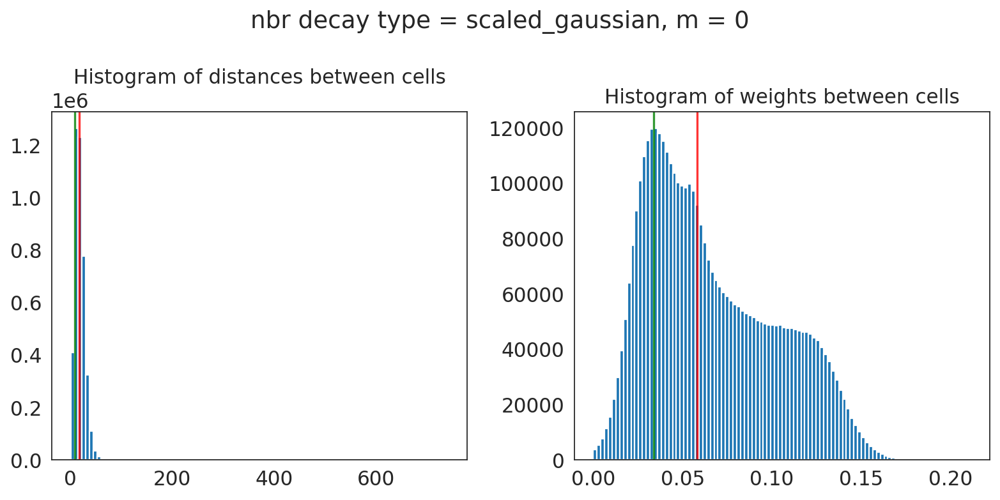

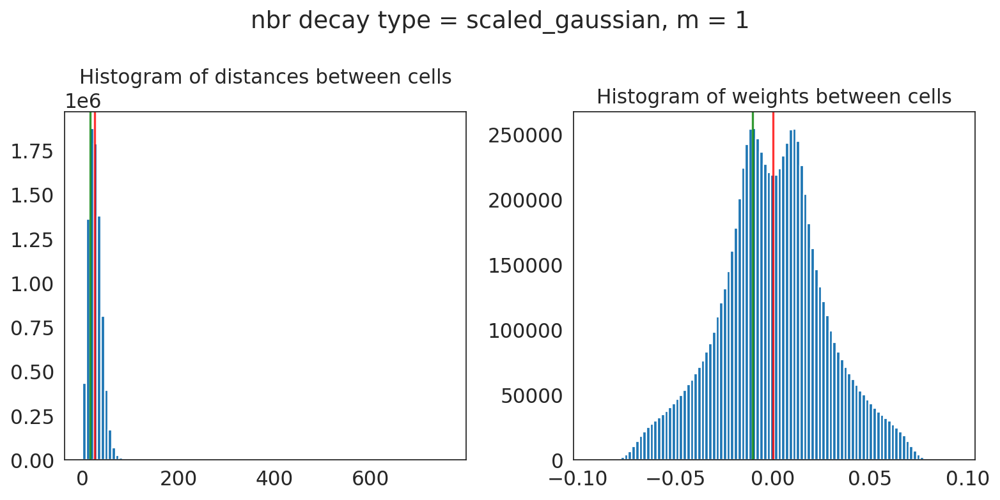

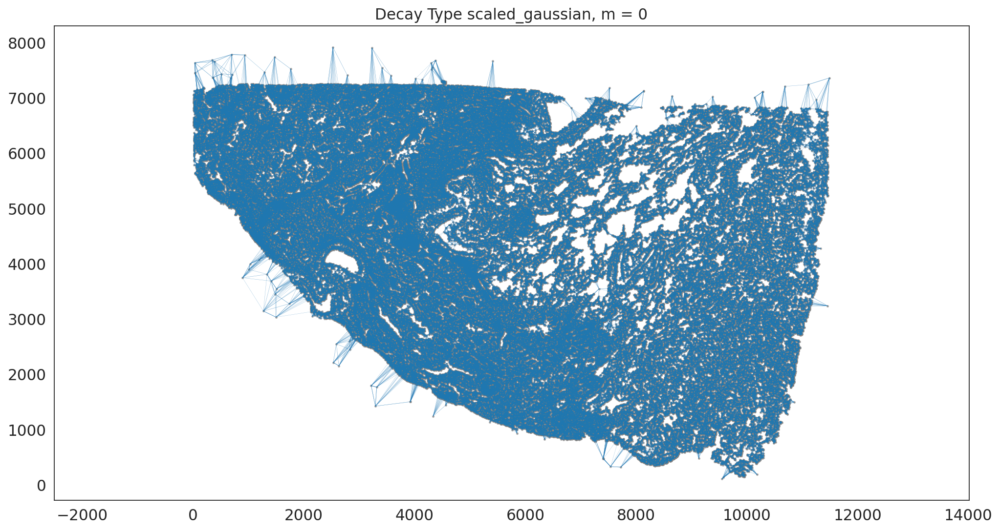

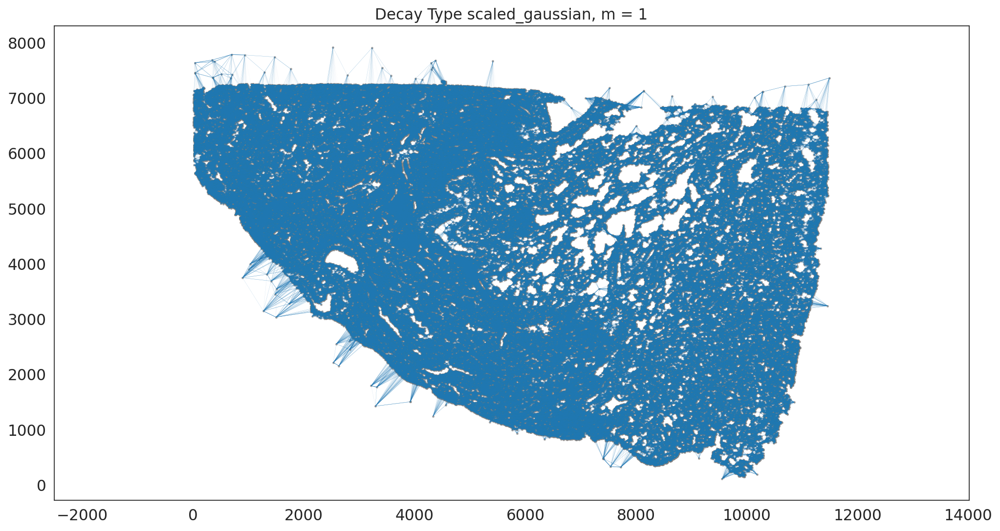

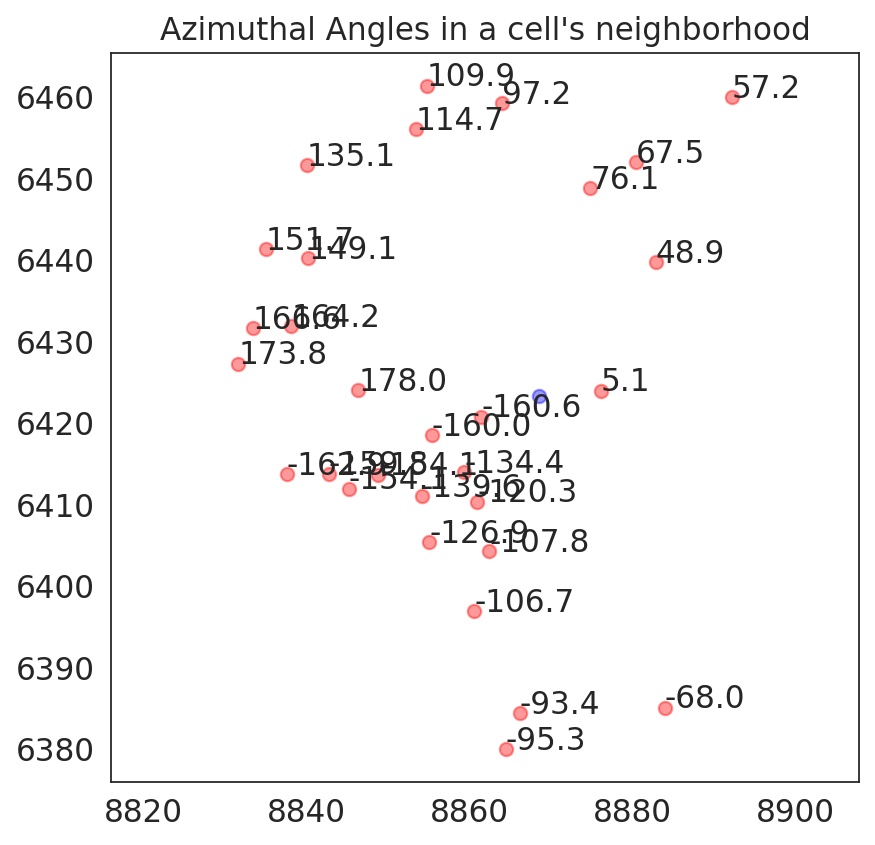

In [14]:
# Generate spatial weights from distance

from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    coord_keys,
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=True,
)

In [15]:
# Generate BANKSY matrix

from banksy.embed_banksy import generate_banksy_matrix

# The following are the main hyperparameters for BANKSY
# -----------------------------------------------------
resolutions = [0.9]  # clustering resolution for UMAP
pca_dims = [20]  # Dimensionality in which PCA reduces to
lambda_list = [0.8]  # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)

Runtime Dec-24-2024-20-07

5001 genes to be analysed:
Gene List:
Index(['A2ML1', 'AAMP', 'AAR2', 'AARSD1', 'ABAT', 'ABCA1', 'ABCA3', 'ABCA4',
       'ABCA7', 'ABCB1',
       ...
       'ZPR1', 'ZSCAN1', 'ZSCAN12', 'ZSCAN16', 'ZSCAN20', 'ZSCAN26', 'ZSWIM6',
       'ZUP1', 'ZYG11B', 'ZYX'],
      dtype='object', length=5001)

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <278328x278328 sparse matrix of type '<class 'numpy.float64'>'
	with 4174920 stored elements in Compressed Sparse Row format>, 1: <278328x278328 sparse matrix of type '<class 'numpy.complex128'>'
	with 8349840 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: -0.01 | Std: 0.31
Size of Nbr | Shape: (278328, 5001)
Top 3 entries of Nbr Mat:

[[-0.0211501  -0.33571154  0.20961259]
 [-0.0211501   0.17321409  0.51363365]
 [-0.0211501  -0.33571154  0.12109494]]

AGF matrix | Mean: 0.1 | Std: 0.15
Size of AGF mat (m = 1) | Shape: (278328, 5001)
Top entries of AGF:
[[1.47839797e-12 6.00190601e-0

In [16]:
# Append Non-spatial results to the banksy_dict for comparsion

from banksy.main import concatenate_all

banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

print(banksy_dict['nonspatial'][0.0]['adata'])

Scale factors squared: [1.]
Scale factors: [1.]
AnnData object with n_obs × n_vars = 278328 × 5001
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'Cluster', 'xcoord', 'ycoord'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std', 'is_nbr', 'k'


In [17]:
# Reduce dimensions of each data matrix

from banksy_utils.umap_pca import pca_umap

pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True,
         plt_remaining_var = False,
         )

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.8)

Setting the total number of PC = 20
Original shape of matrix: (278328, 15003)
Reduced shape of matrix: (278328, 20)
------------------------------------------------------------
min_value = -31.26221848037837, mean = -1.6738998895428823e-14, max = 121.84297637944472

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_20_umap"]
UMAP embedding
------------------------------------------------------------
shape: (278328, 2)


AxisArrays with keys: reduced_pc_20, reduced_pc_20_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 20
Original shape of matrix: (278328, 5001)
Reduced shape of matrix: (278328, 20)
------------------------------------------------------------
min_value = -23.21000862121582, mean = 3.968223609263077e-06, max = 79.53440856933594

Conducting UMAP and adding embeddings to adata.obsm["

In [18]:
# Cluster cells using a partition algorithm

from banksy.cluster_methods import run_Leiden_partition

results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50, # k_expr: number of neighbours in expression (BANKSY embedding or non-spatial) space
    num_iterations = -1, # run to convergenece
    partition_seed = seed,
    match_labels = True,
)

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.8
reduced_pc_20 

reduced_pc_20_umap 

PCA dims to analyse: [20]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.8, PCA dimensions = 20)


Nearest-neighbour weighted graph (dtype: float64, shape: (278328, 278328)) has 13916400 nonzero entries.
---- Ran find_nn in 494.48 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (278328, 278328)) has 13916400 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 300629838 to 13897939.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (278328, 278328)) has 12881803 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (278328, 278328)) has 12881803 nonzero entries.

sNN graph data:
[18 18 12 ...  5  7  9]

---- Ran shared_nn in 13.77 s ----


-- Multiplying sNN connectiv

,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc20_nc0.00_r0.90,nonspatial,0.0,20,0.9,25,"Label object:\nNumber of labels: 25, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 25, number of..."
scaled_gaussian_pc20_nc0.80_r0.90,scaled_gaussian,0.8,20,0.9,17,"Label object:\nNumber of labels: 17, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 17, number of..."


In [ ]:
# Visualize the clustering results from BANKSY, including the clusters from the Umap embbedings

from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels = max_num_labels, 
    save_path = 'Xenium_5K_Lung_Banksy_results.png',
    save_fig = True
)

In [20]:
# 保存banksy的结果

import pickle

data_to_save = {
    'results_df': results_df,
    'weights_graph': weights_graph,
    'c_map': c_map,
    'coord_keys': coord_keys,
    'max_num_labels': max_num_labels
}

with open('Xenium_5K_banksy_saved_data.pkl', 'wb') as f:
    pickle.dump(data_to_save, f)

In [ ]:
# 读取banksy的结果

import pickle

with open('Xenium_5K_banksy_saved_data.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

results_df = loaded_data['results_df']
weights_graph = loaded_data['weights_graph']
c_map = loaded_data['c_map']
coord_keys = loaded_data['coord_keys']
max_num_labels = loaded_data['max_num_labels']

from banksy.plot_banksy import plot_results

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    save_path = 'Xenium_5K_Lung_Banksy_results.png',
    save_fig = True
)

In [3]:
adata = results_df.adata['nonspatial_pc20_nc0.00_r0.90']

# 或 方法 2: 使用 Categorical 类型并指定排序
import pandas as pd

categories = sorted(adata.obs['labels_nonspatial_pc20_nc0.00_r0.90'].unique().tolist())
adata.obs['labels_nonspatial_pc20_nc0.00_r0.90'] = pd.Categorical(adata.obs['labels_nonspatial_pc20_nc0.00_r0.90'], categories=categories, ordered=True)

In [5]:
adata.write("lung_5k_ffpe_banksy_output.h5ad")

/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


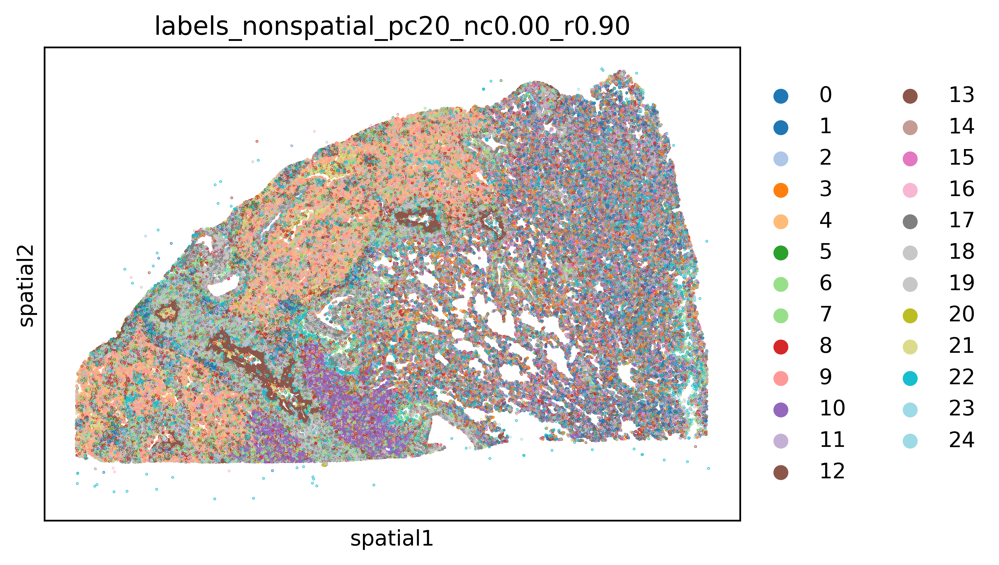

In [30]:
import matplotlib.pyplot as plt
import squidpy as sq

sq.pl.spatial_scatter(results_df.adata['nonspatial_pc20_nc0.00_r0.90'], 
                      color="labels_nonspatial_pc20_nc0.00_r0.90", 
                      shape=None,
                      size=0.2, 
                      palette=plt.cm.tab20,
                      save='Banksy_Cluster.jpg',
                      dpi=600) # 使用tab20

/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/2tbstorage/taobo/miniforge3/envs/banksy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be igno

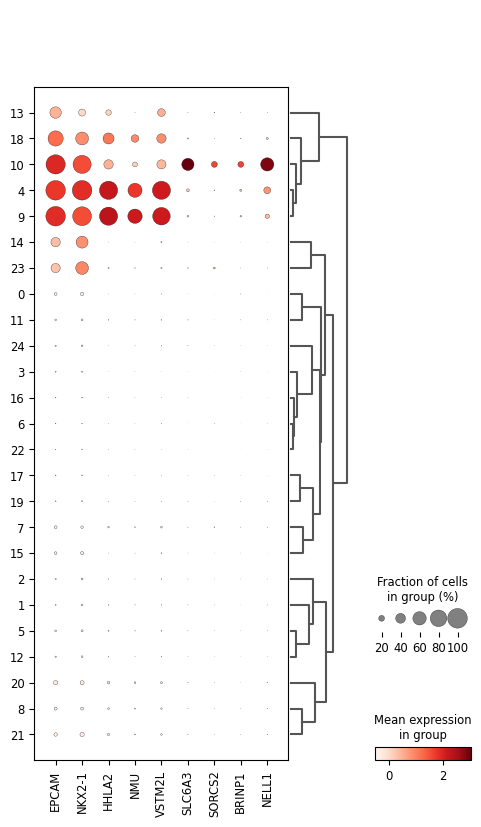

In [37]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from adjustText import adjust_text
import matplotlib

# 将pdf的字体类型设置为42 (TrueType)，确保文字在 Illustrator 中可编辑
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# 定义标记基因（已删除指定基因）
markers = ['EPCAM', 'NKX2-1', 'HHLA2', 'NMU', 'VSTM2L', 'SLC6A3', 'SORCS2', 'BRINP1', 'NELL1']

# 生成标记基因的点图
sc.pl.dotplot(adata, markers, groupby='labels_nonspatial_pc20_nc0.00_r0.90', dendrogram=True, save='dotplot.pdf')
plt.show()